### Import and Helpers

Refer to: https://github.com/rouille/YelpKaggle

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style("whitegrid")

import random
import os
import cv2
from tqdm import tqdm

import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Input
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.models import Model
from keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

from PIL import Image
from PIL import ImageFilter

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### Download and Unzip

In [4]:
#!pip install kaggle

In [5]:
#!mkdir ~/.kaggle

In [6]:
#!cp drive/MyDrive/Colab\ Datasets/ML\ Final/kaggle.json ~/.kaggle/

In [7]:
#!chmod 600 ~/.kaggle/kaggle.json

In [9]:
#!kaggle competitions download yelp-restaurant-photo-classification -f train_photos.tgz

In [10]:
# Remove zip file to free up memory
#import os
#os.remove("./train_photos.tgz.zip")
#os.remove("./train_photos.tgz")

In [ ]:
#!ls drive/MyDrive/Colab\ Datasets/ML\ Final

kaggle.json		   train.csv.tgz
sample_submission.csv	   train_photos
sample_submission.csv.tgz  train_photos.tgz
test_photos.tgz		   train_photo_to_biz_ids.csv
test_photo_to_biz.csv	   train_photo_to_biz_ids.csv.tgz
test_photo_to_biz.csv.tgz  train_preprocessed.csv
train.csv


In [3]:
%%time
!tar -xvf drive/MyDrive/Colab\ Datasets/ML\ Final/train_photos.tgz

Streaming output truncated to the last 5000 lines.
train_photos/._9541.jpg
train_photos/9541.jpg
train_photos/._95410.jpg
train_photos/95410.jpg
train_photos/._95413.jpg
train_photos/95413.jpg
train_photos/._95414.jpg
train_photos/95414.jpg
train_photos/._95416.jpg
train_photos/95416.jpg
train_photos/._95418.jpg
train_photos/95418.jpg
train_photos/._9542.jpg
train_photos/9542.jpg
train_photos/._95420.jpg
train_photos/95420.jpg
train_photos/._95425.jpg
train_photos/95425.jpg
train_photos/._95426.jpg
train_photos/95426.jpg
train_photos/._95427.jpg
train_photos/95427.jpg
train_photos/._95428.jpg
train_photos/95428.jpg
train_photos/._9543.jpg
train_photos/9543.jpg
train_photos/._95430.jpg
train_photos/95430.jpg
train_photos/._95432.jpg
train_photos/95432.jpg
train_photos/._95434.jpg
train_photos/95434.jpg
train_photos/._95435.jpg
train_photos/95435.jpg
train_photos/._95437.jpg
train_photos/95437.jpg
train_photos/._95438.jpg
train_photos/95438.jpg
train_photos/._9544.jpg
train_photos/9544.j

#### Helper Functions

In [3]:
# Helper function to do one hot encoding for labels
def encode_label(labels):
    target = np.zeros(9, dtype='int')
    for l in labels:
        target[l] = 1
    return target

In [4]:
# Helper function transfer path to tensorflow images
def path_to_tensor(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(tensors)

In [12]:
# Helper function to print loss function and accuracy history
def history(model):
    plt.figure(figsize = (15, 5) )

    plt.subplot(121)
    plt.plot(model.history['loss'], color='blue', label='train')
    plt.plot(model.history['val_loss'], color='red', label='valid')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Loss Function')

    plt.subplot(122)
    plt.plot(model.history['binary_accuracy'], color = 'blue', label='train')
    plt.plot(model.history['val_binary_accuracy'], color='red', label='valid')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')

In [6]:
# Helper function to calculate results
def true_pos(y_true, y_pred):
    return np.sum(y_true * y_pred)


def false_pos(y_true, y_pred):
    return np.sum(y_true * (1. - y_pred))


def false_neg(y_true, y_pred):
    return np.sum((1. - y_true) * y_pred)


def precision(y_true, y_pred):
    return true_pos(y_true, y_pred) / (true_pos(y_true, y_pred) + false_pos(y_true, y_pred))


def recall(y_true, y_pred):
    return true_pos(y_true, y_pred) / (true_pos(y_true, y_pred) + false_neg(y_true, y_pred))


def f1_score(y_true, y_pred):
    return 2. / (1. / recall(y_true, y_pred) + 1. / precision(y_true, y_pred))

### EDA

#### Data Load

In [32]:
# Business id to labels
df = pd.read_csv('drive/MyDrive/Colab Datasets/ML Final/train.csv', header = 0, names = ['business','labels']).fillna('')

# Photo id to business id for the training dataset
photo2biz_train = pd.read_csv('drive/MyDrive/Colab Datasets/ML Final/train_photo_to_biz_ids.csv', header = 0, names = ['photo','business'])

# Photo id to business id for the test dataset
photo2biz_test = pd.read_csv('drive/MyDrive/Colab Datasets/ML Final/test_photo_to_biz.csv', header = 0, names = ['photo','business'])

In [33]:
df.head()

,business,labels
0,1000,1 2 3 4 5 6 7
1,1001,0 1 6 8
2,100,1 2 4 5 6 7
3,1006,1 2 4 5 6
4,1010,0 6 8


In [34]:
photo2biz_train.head()

,photo,business
0,204149,3034
1,52779,2805
2,278973,485
3,195284,485
4,19992,485


In [17]:
# Map business to labels
df['labels'] = df['labels'].apply(lambda x: tuple(sorted(int(t) for t in x.split())))
df.set_index('business', inplace=True)

df.head(n=10)

,labels
business,
1000,"(1, 2, 3, 4, 5, 6, 7)"
1001,"(0, 1, 6, 8)"
100,"(1, 2, 4, 5, 6, 7)"
1006,"(1, 2, 4, 5, 6)"
1010,"(0, 6, 8)"
101,"(1, 2, 3, 4, 5, 6)"
1011,"(2, 3, 5, 6)"
1012,"(1, 2, 3, 5, 6)"
1014,"(1, 2, 4, 5, 6)"


In [18]:
# Append photos list to each business
biz2photos_train = photo2biz_train.groupby('business')['photo'].apply(list)
df['photos'] = biz2photos_train
df['n_photos'] = biz2photos_train.apply(len)

df.head(n=10)

,labels,photos,n_photos
business,,,
1000,"(1, 2, 3, 4, 5, 6, 7)","[438623, 325966, 227692, 407856, 368729, 16319...",54
1001,"(0, 1, 6, 8)","[298536, 20346, 8457, 308694, 349310, 407838, ...",9
100,"(1, 2, 4, 5, 6, 7)","[338465, 328433, 243861, 361777, 127198, 46652...",84
1006,"(1, 2, 4, 5, 6)","[46472, 341947, 396253, 75316, 42330, 244095, ...",22
1010,"(0, 6, 8)","[118251, 219940, 27517, 8578, 148347, 433559, ...",11
101,"(1, 2, 3, 4, 5, 6)","[13736, 393696, 286907, 86169, 243460, 254663,...",121
1011,"(2, 3, 5, 6)","[372371, 116870, 411981, 208597, 127752, 18839...",70
1012,"(1, 2, 3, 5, 6)","[287385, 232258, 388225, 151345, 417121, 32754...",37
1014,"(1, 2, 4, 5, 6)","[407910, 33911, 269241, 374218, 256236, 296370...",32


In [19]:
# Train data info
print('There are %d businesses in the training dataset' % len(df))
print('There are %d photos in the training dataset' % df['n_photos'].sum())
print('There are %d photos per business on average' % df['n_photos'].mean())

There are 2000 businesses in the training dataset
There are 234842 photos in the training dataset
There are 117 photos per business on average


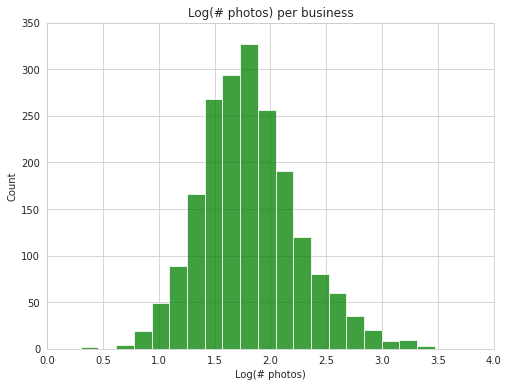

In [20]:
# Number of photos per business distribution in Train data
import math

n_photos = [math.log10(x) for x in df['n_photos'].tolist()]

plt.figure(figsize = (8,6))
n, bins, patches = plt.hist(n_photos, 20, facecolor='g', alpha=0.75)

plt.xlabel('Log(# photos)')
plt.ylabel('Count')
plt.title('Log(# photos) per business')
plt.axis([0, 4, 0, 350])
plt.grid(True)
plt.show()

In [86]:
# Create label dictionary and transfer labels to strings
from collections import OrderedDict

labels = OrderedDict()
labels['0'] = 'good_for_lunch'
labels['1'] = 'good_for_dinner'
labels['2'] = 'takes_reservations'
labels['3'] = 'outdoor_seating'
labels['4'] = 'restaurant_is_expensive'
labels['5'] = 'has_alcohol'
labels['6'] = 'has_table_service'
labels['7'] = 'ambience_is_classy'
labels['8'] = 'good_for_kids'

train_labels = np.vstack(df['labels'].apply(encode_label))

In [27]:
# Test data info
biz2photos_test = photo2biz_test.groupby('business')['photo'].apply(list).to_dict()
biz_test = list(biz2photos_test.keys())
print('There are %d businesses in the test dataset.' % len(biz_test))

There are 10000 businesses in the test dataset.


#### Visualization

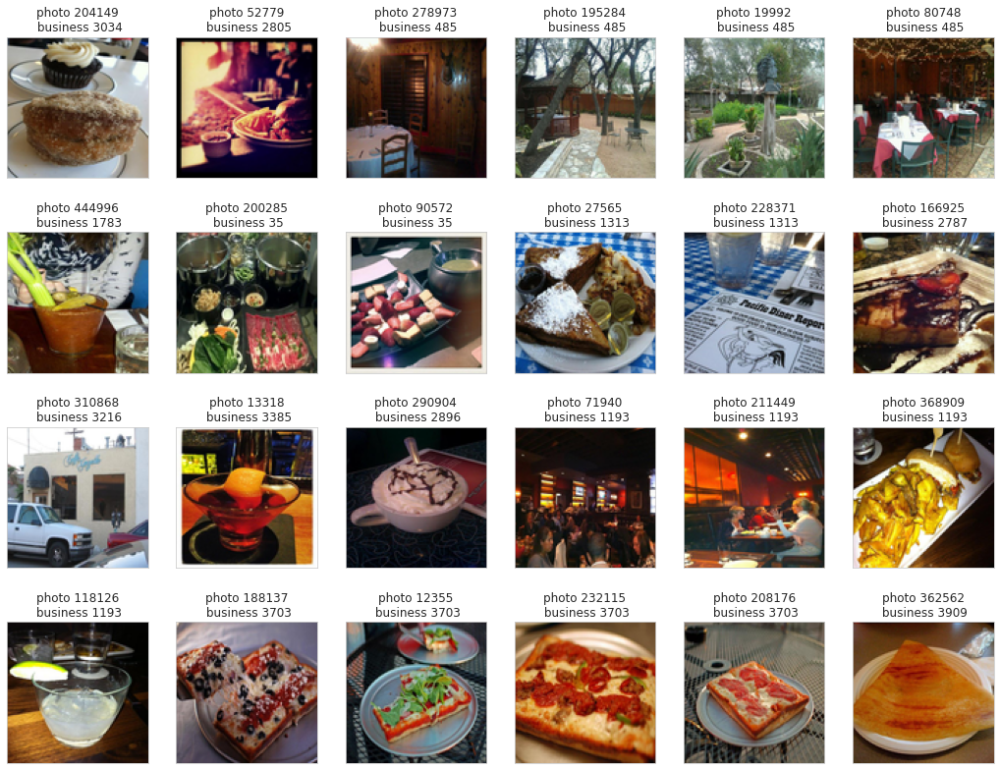

In [30]:
# Display the first 24 images in the training dataset
fig = plt.figure(figsize = (18,14))
for i in range(24):
    img = Image.open('./train_photos/' + str(photo2biz_train.loc[i][0]) + '.jpg')
    img = img.resize((100, 100), Image.ANTIALIAS)
    ax = fig.add_subplot(4, 6, i+1, xticks = [], yticks = [])
    ax.set_title('photo ' + str(photo2biz_train.loc[i][0]) + '\n business ' + str(photo2biz_train.loc[i][1]))
    ax.imshow(img)

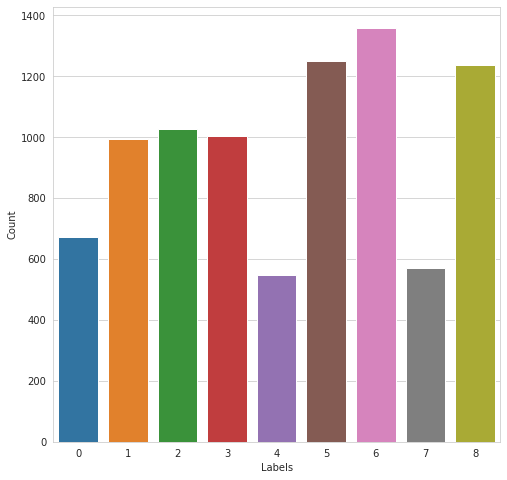

In [87]:
# Display distribution of the number of each label
fig = plt.figure(figsize = (8,8))
ax = sns.barplot(x=list(labels.keys()), y=list(np.sum(train_labels, axis = 0)))
ax.set_xlabel('Labels')
ax.set_ylabel('Count')
plt.show()

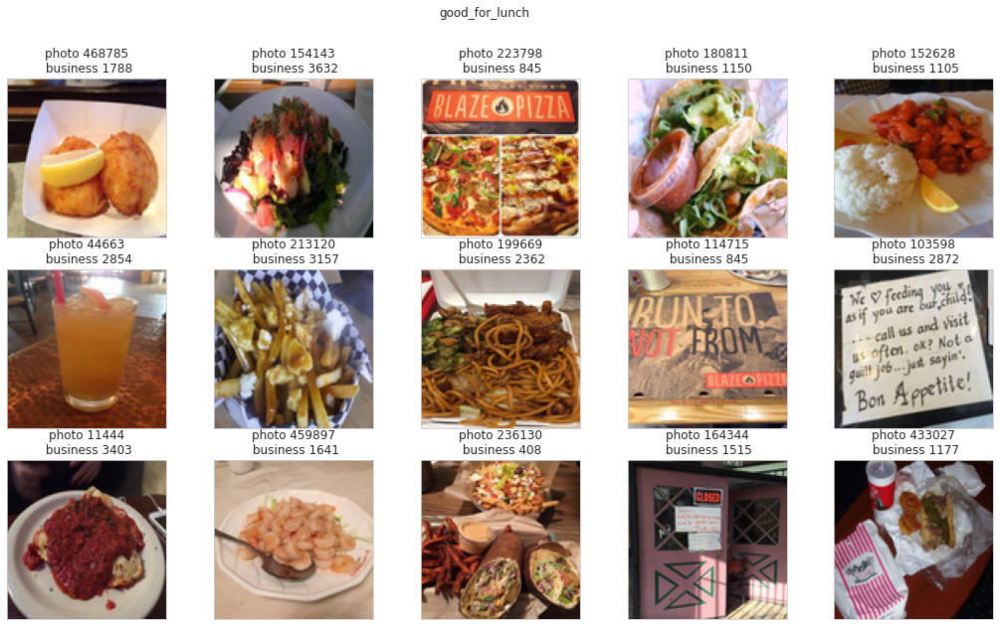

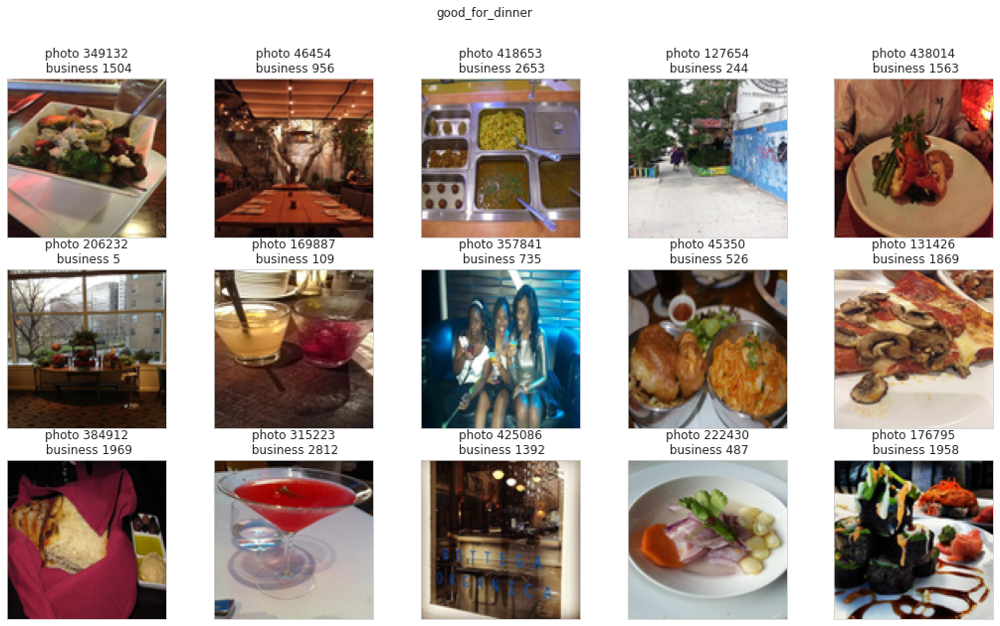

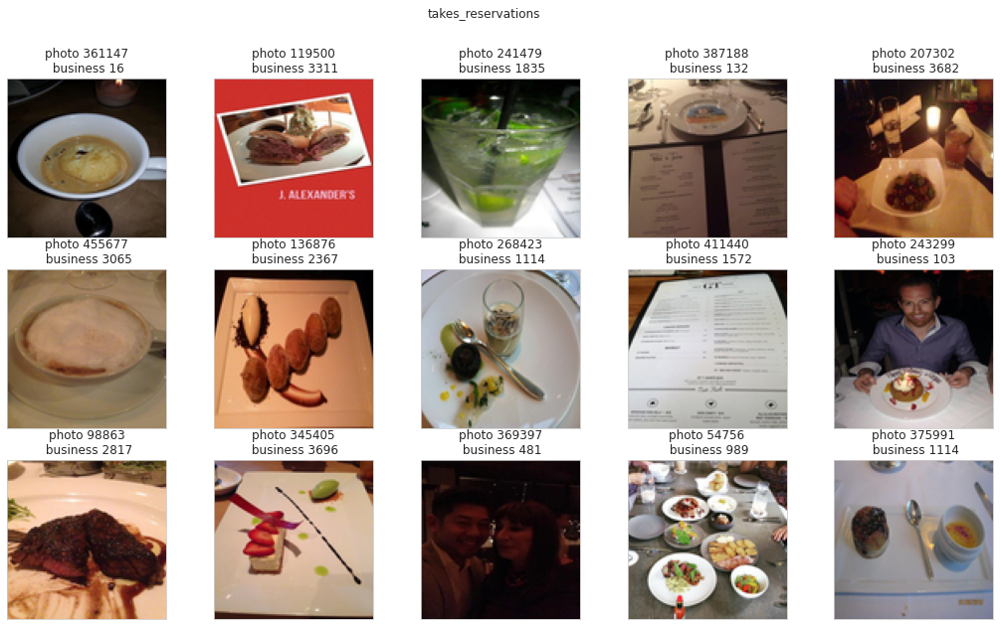

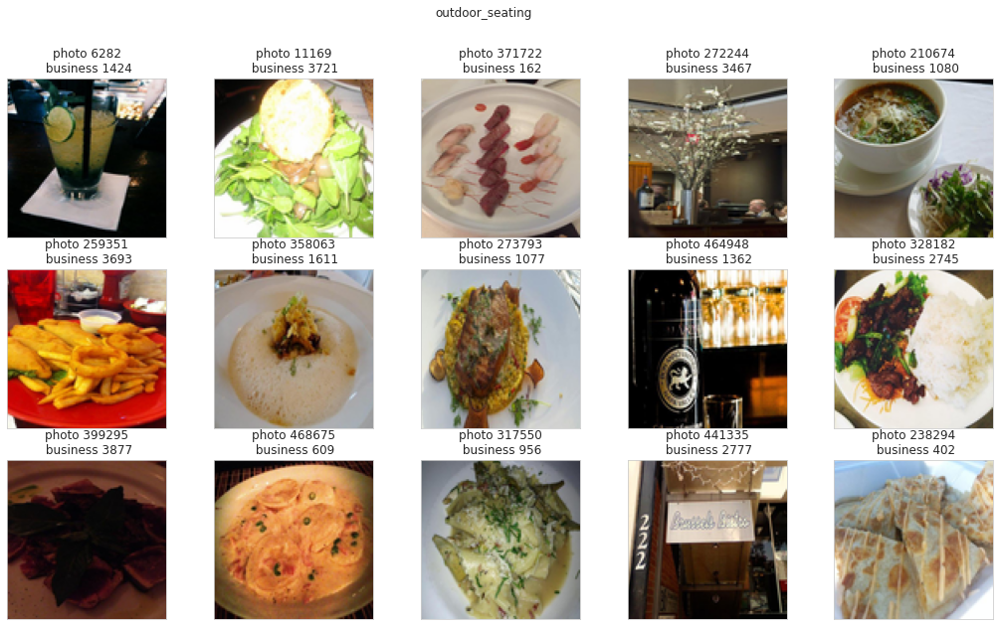

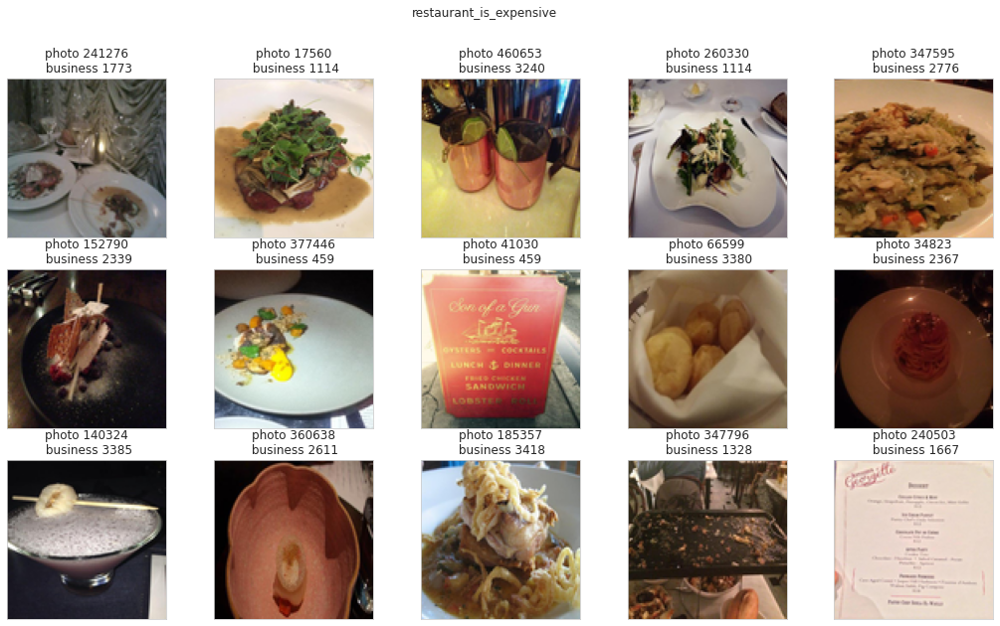

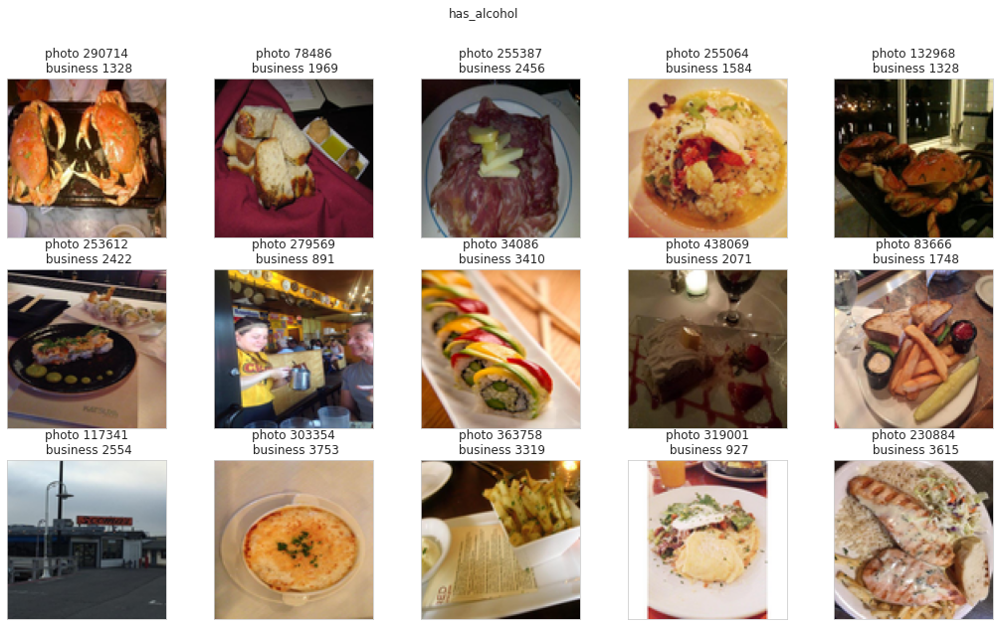

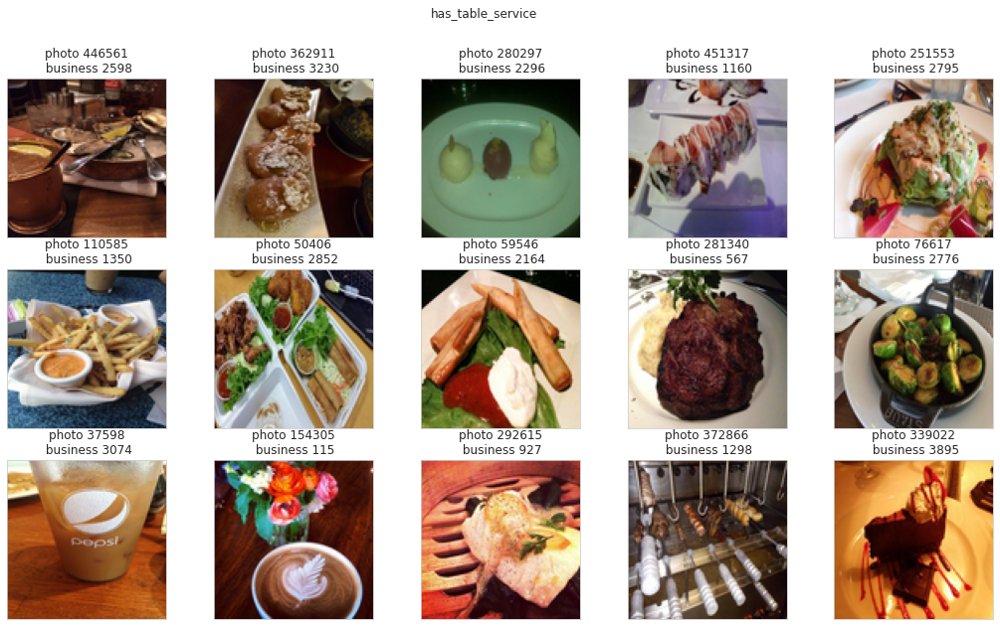

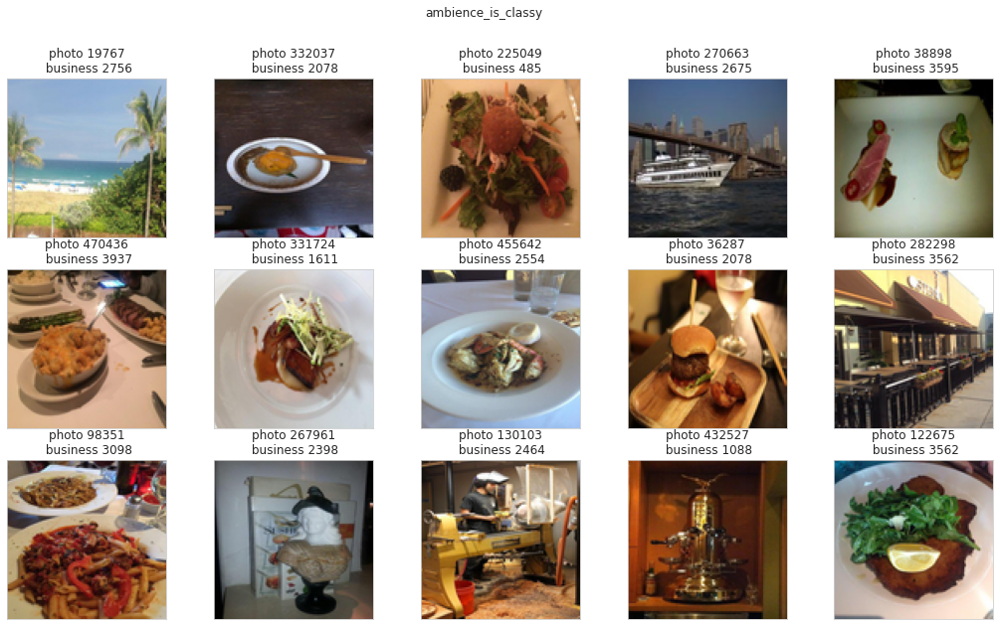

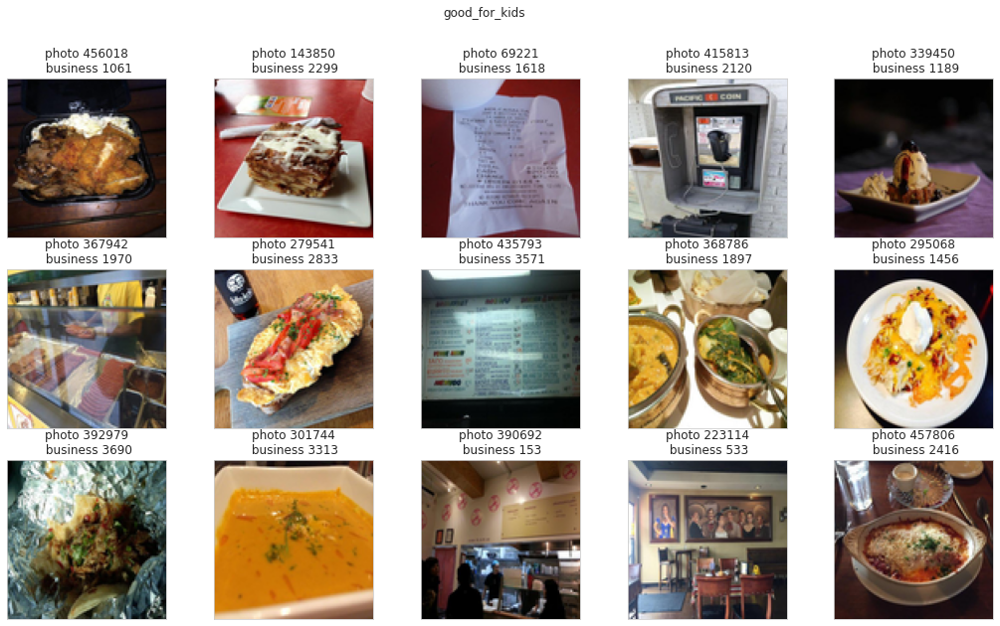

In [75]:
# Display sample images for each label
nImage = 15

for l, v in labels.items():
    photo_ids = np.random.choice(np.hstack(df[df['labels'].apply(lambda x: l in map(str,x))]['photos']), nImage)
    fig = plt.figure(figsize = (18,10))
    fig.suptitle(v)
    biz_ids = [list(photo2biz_train.loc[photo2biz_train['photo'] == i, 'business'])[0] for i in photo_ids]
    for i in range(len(photo_ids)):
        img = Image.open('./train_photos/' + str(photo_ids[i]) + '.jpg')
        img = img.resize((100, 100), Image.ANTIALIAS)
        ax = fig.add_subplot(3, 5, i+1, xticks = [], yticks = [])
        ax.set_title('photo ' + str(photo_ids[i]) + '\n business ' + str(biz_ids[i]))
        ax.imshow(img)

### Preprocess

In [7]:
# Business id to labels
biz2labels = pd.read_csv('drive/MyDrive/Colab Datasets/ML Final/train.csv', header = 0, names = ['business','labels']).fillna('')

# Photo id to business id for the training dataset
photo2biz_train = pd.read_csv('drive/MyDrive/Colab Datasets/ML Final/train_photo_to_biz_ids.csv', header = 0, names = ['photo','business'])

# Get list of photo id 
photo_ids = np.array(photo2biz_train['photo'])

print('There are %d training images' % len(photo_ids))

There are 234842 training images


In [8]:
biz2labels['labels'] = biz2labels['labels'].apply(lambda x: tuple(sorted(int(t) for t in x.split())))
biz2labels.set_index('business', inplace=True)
biz2labels.head(n=10)

,labels
business,
1000,"(1, 2, 3, 4, 5, 6, 7)"
1001,"(0, 1, 6, 8)"
100,"(1, 2, 4, 5, 6, 7)"
1006,"(1, 2, 4, 5, 6)"
1010,"(0, 6, 8)"
101,"(1, 2, 3, 4, 5, 6)"
1011,"(2, 3, 5, 6)"
1012,"(1, 2, 3, 5, 6)"
1014,"(1, 2, 4, 5, 6)"


In [9]:
biz2labels.loc[photo2biz_train['business']]['labels']

business
3034                      (3, 8)
2805          (1, 2, 3, 5, 6, 7)
485        (1, 2, 3, 4, 5, 6, 7)
485        (1, 2, 3, 4, 5, 6, 7)
485        (1, 2, 3, 4, 5, 6, 7)
                  ...           
496              (1, 4, 5, 6, 7)
3565                (1, 2, 5, 6)
1875          (1, 2, 5, 6, 7, 8)
3888    (0, 1, 2, 3, 5, 6, 7, 8)
3888    (0, 1, 2, 3, 5, 6, 7, 8)
Name: labels, Length: 234842, dtype: object

In [10]:
photo_targets = np.vstack(biz2labels.loc[photo2biz_train['business']]['labels'].apply(encode_label))
print('Number of rows: %d - Number of columns: %d' % (photo_targets.shape[0], photo_targets.shape[1]))

Number of rows: 234842 - Number of columns: 9


In [11]:
from sklearn.model_selection import train_test_split

train_files, test_files, train_targets, test_targets = train_test_split(photo_ids,
                                                                        photo_targets,
                                                                        test_size=0.25,
                                                                        random_state=7)

valid_files, valid_targets = (test_files[:int(len(test_files)/2)], test_targets[:int(len(test_files)/2)])
test_files, test_targets = (test_files[int(len(test_files)/2):], test_targets[int(len(test_files)/2):])

print('There are %d images in the training dataset' % len(train_files))
print('There are %d images in the validation dataset' % len(valid_files))
print('There are %d images in the test dataset' % len(test_files))

There are 176131 images in the training dataset
There are 29355 images in the validation dataset
There are 29356 images in the test dataset


### Bottleneck Features Extraction

In [12]:
# Load Pictures
train_files = np.array(['./train_photos/' + str(i) + '.jpg' for i in train_files])
valid_files = np.array(['./train_photos/' + str(i) + '.jpg' for i in valid_files])
test_files = np.array(['./train_photos/' + str(i) + '.jpg' for i in test_files])

print('There are %d images in the training dataset' % len(train_files))
print('There are %d images in the validation dataset' % len(valid_files))
print('There are %d images in the test dataset' % len(test_files))

There are 176131 images in the training dataset
There are 29355 images in the validation dataset
There are 29356 images in the test dataset


In [13]:
# Number of pictures to process for each dataset
nb_train, nb_valid, nb_test = (10000,1000,1000)

#### ResNet50

In [15]:
# Preprocess pictures to tensors
train_tensors = preprocess_input(paths_to_tensor(train_files[:nb_train]))
valid_tensors = preprocess_input(paths_to_tensor(valid_files[:nb_valid]))
test_tensors = preprocess_input(paths_to_tensor(test_files[:nb_test]))

100%|██████████| 1500/1500 [00:08<00:00, 173.15it/s]


In [16]:
# Import the ResNet50 Model, with the Final Fully-Connected Layers Removed
# So that we can receive the bottleneck features.
model = ResNet50(include_top=False)
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                        

In [ ]:
# Extract Output of Final Max Pooling Layer for the bottleneck features.
train_resnet50 = model.predict(train_tensors)
valid_resnet50 = model.predict(valid_tensors)
test_resnet50  = model.predict(test_tensors)

In [19]:
# Show reults
print(train_resnet50.shape)
print(valid_resnet50.shape)
print(test_resnet50.shape)

(10000, 7, 7, 2048)
(1000, 7, 7, 2048)
(1000, 7, 7, 2048)


In [28]:
#!touch drive/MyDrive/Colab\ Datasets/ML\ Final/bottleneck_features/yelp_resnet50.npz

In [30]:
# Save Transformed Data
np.savez('drive/MyDrive/Colab Datasets/ML Final/bottleneck_features/yelp_resnet50.npz', 
         train_features=train_resnet50, train_targets=train_targets[:nb_train],
         valid_features=valid_resnet50, valid_targets=valid_targets[:nb_valid],
         test_features=test_resnet50, test_targets=test_targets[:nb_test])

Other models: https://github.com/rouille/YelpKaggle/blob/master/bottleneckFeaturesExtraction.ipynb

ResNet50 is the best performing model among all according to here: https://github.com/rouille/YelpKaggle/blob/master/pretrainedModelsComparison.ipynb

### Classification

#### ResNet50

##### Transformed Data1

In [23]:
# Load Transformed Data
bottleneck_features = np.load('drive/MyDrive/Colab Datasets/ML Final/bottleneck_features/yelp_resnet50.npz')
train_resnet50 = bottleneck_features['train_features']
valid_resnet50 = bottleneck_features['valid_features']
test_resnet50 = bottleneck_features['test_features']

train_targets = bottleneck_features['train_targets']
valid_targets = bottleneck_features['valid_targets']
test_targets = bottleneck_features['test_targets']

##### Transformed Data2

In [35]:
# Import preprocessed train data
import pickle5 as pickle
with open('drive/MyDrive/Colab Datasets/ML Final/train_preprocessed.csv', "rb") as fh:
  train_df = pickle.load(fh)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 256 kB 9.8 MB/s 


In [36]:
# Remove nan values
train_df["labels"] = train_df["labels"].apply(lambda x: [i for i in x if str(i) != "nan"])

In [37]:
# One-hot encoding of labels
from sklearn.preprocessing import MultiLabelBinarizer

# Process train & test set into an array format
X = np.array([x for x in train_df['features']])
X = np.asarray(X).astype(np.float32)

y = train_df['labels']
mlb = MultiLabelBinarizer()
y = mlb.fit_transform(y)

# Check shape of array-format train & test set 
print("X: ", X.shape)
print("y: ", y.shape)

X:  (2000, 1, 120, 120, 3)
y:  (2000, 9)


In [39]:
from sklearn.model_selection import train_test_split
train_resnet50, valid_resnet50, train_targets, valid_targets = train_test_split(X, y, test_size=0.2, random_state=42)

In [42]:
train_resnet50 = train_resnet50.astype('float32')
valid_resnet50 = valid_resnet50.astype('float32')
train_resnet50 /= 120
valid_resnet50 /= 120

train_resnet50 = train_resnet50.reshape(train_resnet50.shape[0], train_resnet50.shape[2], train_resnet50.shape[3], train_resnet50.shape[4])
valid_resnet50 = valid_resnet50.reshape(valid_resnet50.shape[0], valid_resnet50.shape[2], valid_resnet50.shape[3], valid_resnet50.shape[4])

In [43]:
print("X_train: ", train_resnet50.shape)
print("y_train: ", train_targets.shape)

X_train:  (1600, 120, 120, 3)
y_train:  (1600, 9)


##### Fit

In [24]:
# Create Model
from keras.models import Sequential
from keras.layers import GlobalAveragePooling2D, MaxPooling2D 
from keras.layers import Conv2D, Dense, Dropout, Activation, Flatten, BatchNormalization
from keras.regularizers import l2

resnet50 = Sequential()
resnet50.add(GlobalAveragePooling2D(input_shape=train_resnet50.shape[1:]))

resnet50.add(Dense(1024, activation='relu', kernel_regularizer=l2(1e-4)))
resnet50.add(BatchNormalization())
resnet50.add(Dropout(0.3))

resnet50.add(Dense(512, activation='relu', kernel_regularizer=l2(1e-4)))
resnet50.add(BatchNormalization())
resnet50.add(Dropout(0.3))

resnet50.add(Dense(256, activation='relu', kernel_regularizer=l2(1e-4)))
resnet50.add(BatchNormalization())

resnet50.add(Dense(9, activation='sigmoid'))

resnet50.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 global_average_pooling2d_2   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_8 (Dense)             (None, 1024)              2098176   
                                                                 
 batch_normalization_6 (Batc  (None, 1024)             4096      
 hNormalization)                                                 
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0         
                                                                 
 dense_9 (Dense)             (None, 512)               524800    
                                                                 
 batch_normalization_7 (Batc  (None, 512)             

In [25]:
# Compile Model
from tensorflow.keras.optimizers import SGD

sgd = SGD(lr=0.0001, decay=1e-6, momentum=0.9, nesterov=True)
resnet50.compile(loss='binary_crossentropy', optimizer=sgd, metrics=['binary_accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [26]:
# Fit Model with save
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpointer = ModelCheckpoint(filepath='drive/MyDrive/Colab Datasets/ML Final/saved_models/weights_compare_resnet50.hdf5', save_best_only=True)
checkimprovement = EarlyStopping(monitor='val_loss', min_delta=0, patience=20)

history_resnet50 = resnet50.fit(train_resnet50, train_targets, 
                                validation_data=(valid_resnet50,valid_targets), 
                                epochs=1000, batch_size=64,
                                callbacks=[checkpointer,checkimprovement])

Epoch 1/1000
157/157 [==============================] - 5s 26ms/step - loss: 1.1184 - binary_accuracy: 0.5075 - val_loss: 0.9749 - val_binary_accuracy: 0.5146
Epoch 2/1000
157/157 [==============================] - 2s 15ms/step - loss: 1.0979 - binary_accuracy: 0.5182 - val_loss: 0.9914 - val_binary_accuracy: 0.5279
Epoch 3/1000
157/157 [==============================] - 2s 15ms/step - loss: 1.0735 - binary_accuracy: 0.5302 - val_loss: 0.9897 - val_binary_accuracy: 0.5427
Epoch 4/1000
157/157 [==============================] - 2s 15ms/step - loss: 1.0605 - binary_accuracy: 0.5402 - val_loss: 0.9800 - val_binary_accuracy: 0.5561
Epoch 5/1000
157/157 [==============================] - 3s 16ms/step - loss: 1.0451 - binary_accuracy: 0.5474 - val_loss: 0.9698 - val_binary_accuracy: 0.5673
Epoch 6/1000
157/157 [==============================] - 2s 16ms/step - loss: 1.0314 - binary_accuracy: 0.5585 - val_loss: 0.9588 - val_binary_accuracy: 0.5770
Epoch 7/1000
157/157 [========================

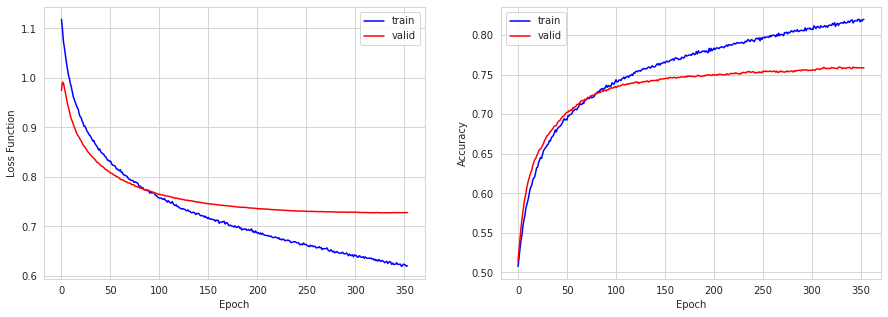

In [27]:
# Print Loss Functions and Accuracy
history(history_resnet50)

##### Predict

In [14]:
# Load Model
resnet50.load_weights('drive/MyDrive/Colab Datasets/ML Final/saved_models/weights_compare_resnet50.hdf5')

In [28]:
# Make Prediction on Test
resnet50_predictions = (resnet50.predict(test_resnet50) >= 0.5).astype(int)

In [29]:
# F1 Score
resnet50_score = f1_score(test_targets, resnet50_predictions)
print('F1 score: %.5f' % resnet50_score)

F1 score: 0.75683


Refer: https://github.com/rouille/YelpKaggle/blob/master/nn.ipynb